<a href="https://colab.research.google.com/github/AburizalAN/learn-ml/blob/master/cnn/Stable_Diffusion_Basic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stable Diffusion - Basic


**`[ ! Attention ]`** It's crucial to verify the license of the models, particularly if there's an intention to use the obtained results for commercial purposes.

1. It's essential to utilize these models responsibly and ethically. They should not be employed to create or disseminate illegal or harmful content. This includes, but is not limited to, content that is violent, hateful, sexually explicit, or infringes on someone's privacy or rights.

2. As a user, the rights to the outputs generated using the model are retained. However, accountability for how these outputs are used also lies with the user. They should not be used in a manner that breaches the terms of the license or any applicable laws or regulations.

3. The model can be used commercially or as a service, and the weights can be redistributed. However, if this is done, the same use restrictions as those in the original license must be included. A copy of the CreativeML OpenRAIL-M license must also be provided to all users.

(Licence of v1.4 e v1.5 https://huggingface.co/spaces/CompVis/stable-diffusion-license)


With that out of the way, let's try out various things we can do with Stable Diffusion. Let's get started!

> Note:
> - Some images when re-run will not be the same, even with the same seed.
> - Stable Diffusion is resource intensive in terms of need for GPU and large hard disk space, we may need to "disconnect and delete the runtime" and continue halfway through this notebook.

In [ ]:
!nvidia-smi

Mon Feb 19 13:33:50 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   51C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Installing the libraries

- Install the necessary libraries for stable diffusion
- [xformers](https://github.com/facebookresearch/xformers) for memory optimization


In [ ]:
!pip install diffusers==0.11.1
!pip install -q accelerate transformers ftfy bitsandbytes==0.35.0 gradio natsort safetensors xformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.0/280.0 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 33.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.2/218.2 MB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.1/92.1 kB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.0/139.0 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 33.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 6.9 MB/

## Pipeline for image generation

- We can define with little effort a pipeline to use the Stable Diffusion model, through the [StableDiffusionPipeline](https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py)


In [ ]:
import torch #PyTorch
from diffusers import StableDiffusionPipeline

/usr/local/lib/python3.10/dist-packages/transformers/utils/generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
/usr/local/lib/python3.10/dist-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
/usr/local/lib/python3.10/dist-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

safety_checker/pytorch_model.fp16.safetensors not found


Fetching 30 files:   0%|          | 0/30 [00:00<?, ?it/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.non_ema.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

(…)fusion_pytorch_model.non_ema.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
pipe = pipe.to('cuda') #We'll always use GPU, make sure your change your runtime to use GPU is you're on Collab

In [ ]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()


Sometime during image generation, the image may come out all black, to avoid this we can disable safety checker.

In [ ]:
#avoid all black images, disabling it is easy, you can do this:
pipe.safety_checker = lambda images, clip_input: (images, False)

### Creating the prompt

In [ ]:
prompt = 'five-horned rhinoceros'

### Generating the image



In [ ]:
img = pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

### Display the image

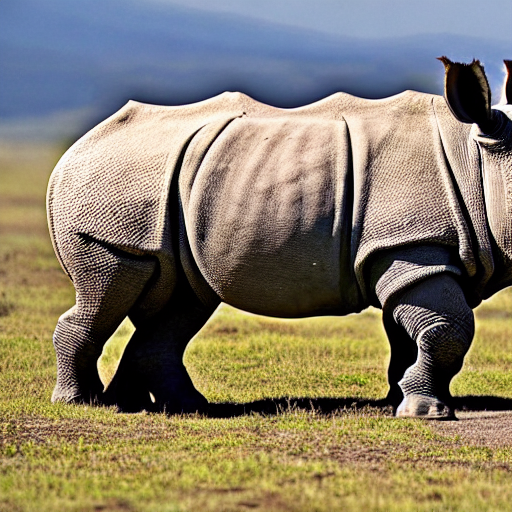

In [ ]:
img

### Saving the result

In [ ]:
# Pillow
img.save('result.png')

## Let's continue our experimentation.

  0%|          | 0/50 [00:00<?, ?it/s]

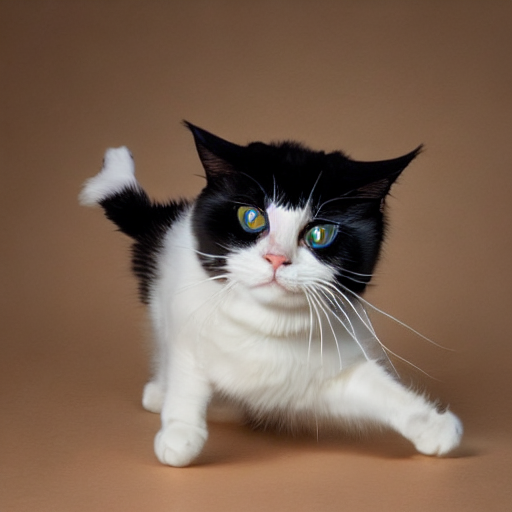

In [ ]:
prompt = 'photograph of orange cat, realistic, full hd'
img = pipe(prompt).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

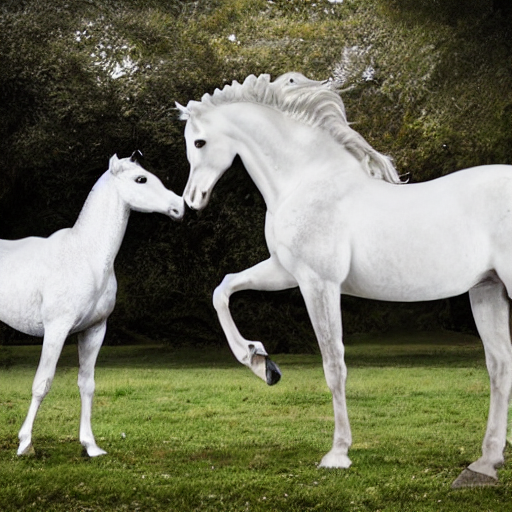

In [ ]:
prompt = 'white horse and its knight'
img = pipe(prompt).images[0]
img

## Generating multiple images

In [ ]:
from PIL import Image

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w * scale), int(h * scale)

  grid = Image.new('RGB', size = (cols * w, rows * h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
    img = img.resize((w, h), Image.ANTIALIAS)
    grid.paste(img, box=(i % cols * w, i // cols * h))
  return grid

  0%|          | 0/50 [00:00<?, ?it/s]

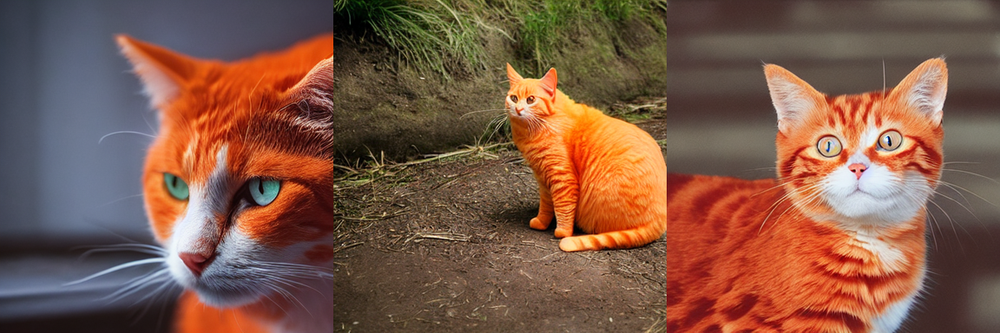

In [ ]:
num_imgs = 3
prompt = 'photograph of orange cat'
imgs = pipe(prompt, num_images_per_prompt=num_imgs).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

## Parameters

There are some parameters we can set

### Seed

We can set `seed` if we want to generate similar images.


  0%|          | 0/50 [00:00<?, ?it/s]

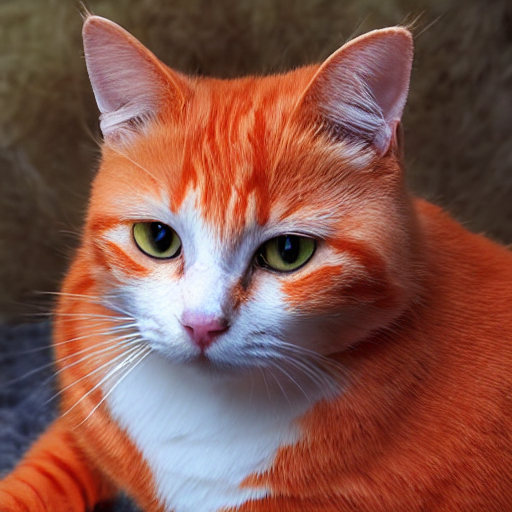

In [ ]:
seed = 2000
generator = torch.Generator('cuda').manual_seed(seed)
img = pipe(prompt, generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

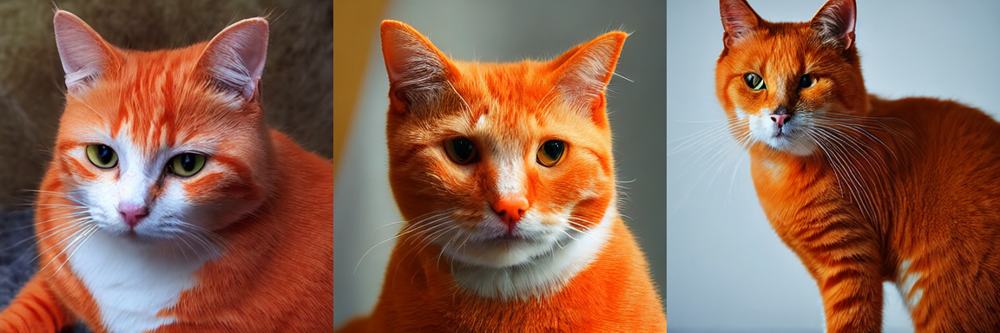

In [ ]:
prompt = "photograph of orange cat"
seed = 2000 #randomizer awal pas mau generate
generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompt, num_images_per_prompt=num_imgs, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

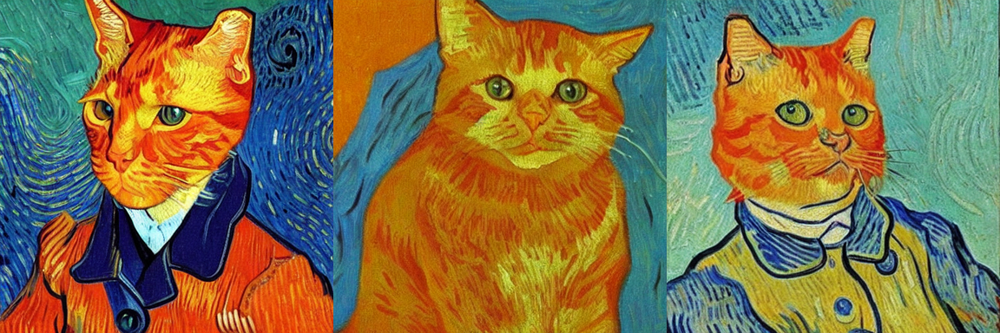

In [ ]:
prompt = "van gogh painting of an orange cat"
generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompt, num_images_per_prompt=num_imgs, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

### Inference steps

Inference steps refer to the number of denoising steps to reach the final image. The default number of inference steps of 50. If you want faster results you can use a smaller number. If you want potentially higher quality results, you can use larger numbers.

Let's try out running the pipeline with less denoising steps.

  0%|          | 0/3 [00:00<?, ?it/s]

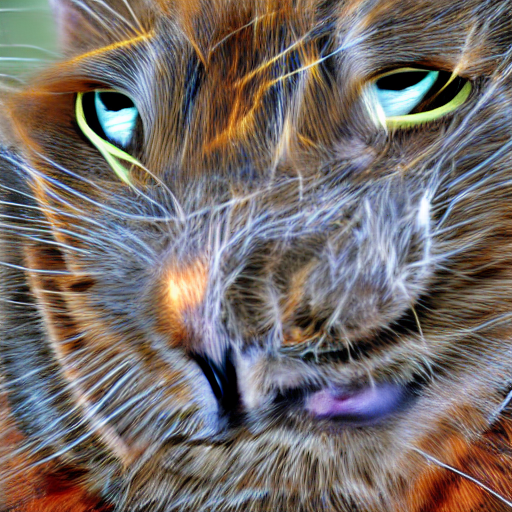

In [ ]:
prompt = "photograph of orange cat, realistic, full hd"
generator = torch.Generator("cuda").manual_seed(seed)
img = pipe(prompt, num_inference_steps=3, generator=generator).images[0]
img

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

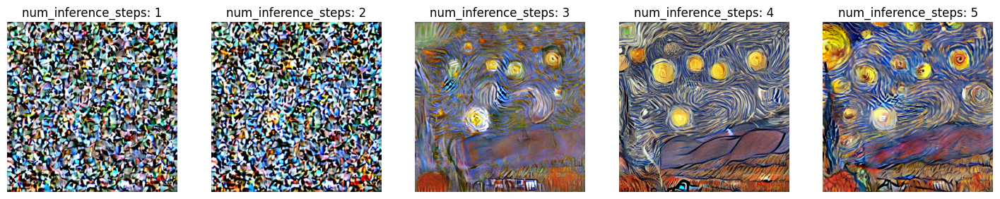

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18,8))
for i in range(1, 6):
  n_steps = i * 1
  #print(n_steps)
  generator = torch.Generator('cuda').manual_seed(seed)
  img = pipe(prompt, num_inference_steps=n_steps, generator=generator).images[0]

  plt.subplot(1, 5, i)
  plt.title('num_inference_steps: {}'.format(n_steps))
  plt.imshow(img)
  plt.axis('off')
plt.show()

### Guidance Scale (CFG / Strength)

CFG stands for Classifier-Free Guidance, so CFG scale can be referred to as Classifier-Free Guidance scale.

So, before 2022, there was a method called classifier guidance. It's a method that can balance between mode coverage and sample quality in diffusion models after training, similar to low-temperature sampling or truncation in other generative models. Essentially, classifier guidance is a mix between the score estimate from the diffusion model and the gradient from the image classifier. However, if we want to use it, we have to train an image classifier that's different from the diffusion model.

Then, a question arises, **can we have guidance without a classifier?**

In 2022, Jonathan Ho and Tim Salimans from Google Brain demonstrated that we can use a pure generative model without a classifier. The title of their paper is "Classifier-Free Guidance". They train both conditional and unconditional diffusion models together, then they combine the score estimates from both to achieve a trade-off between sample quality and diversity, similar to using classifier guidance.

It's this CFG that Stable Diffusion uses to balance between the prompt and the Stable Diffusion model. If the CFG Scale is low, the image won't follow the prompt. But if the CFG Scale is high, the result will be a random colorful image that doesn't resemble the prompt at all.

The most suitable choice for CFG Scale is between 6.0 - 15.0. Lower values are good for photorealistic images, while higher values are suitable for a more artistic style.

  0%|          | 0/50 [00:00<?, ?it/s]

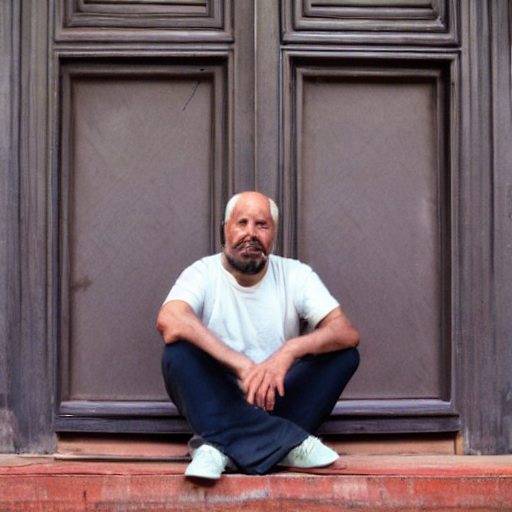

In [ ]:
prompt = "a man sit in front of the door"

generator = torch.Generator("cuda").manual_seed(seed)
img = pipe(prompt, guidance_scale=7, generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

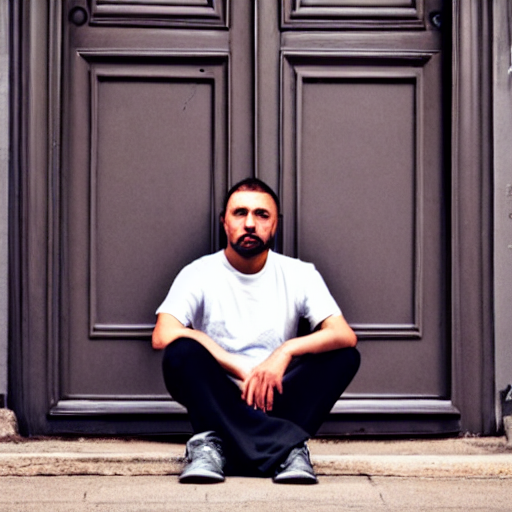

In [ ]:
prompt = "a man sit in front of the door"

generator = torch.Generator("cuda").manual_seed(seed)
img = pipe(prompt, guidance_scale=14, generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

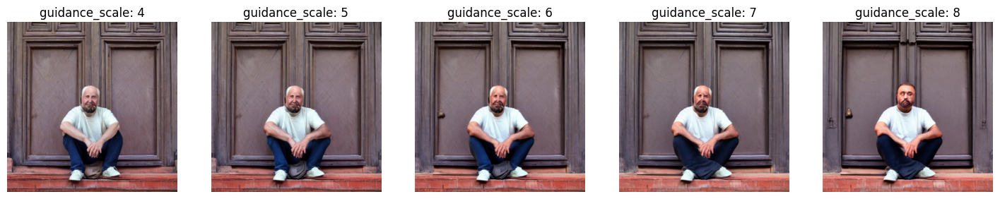

In [ ]:
plt.figure(figsize=(18,8))
for i in range(1, 6):

  n_guidance = i + 3
  generator = torch.Generawtor("cuda").manual_seed(seed)
  img = pipe(prompt, guidance_scale=n_guidance, generator=generator).images[0]

  plt.subplot(1,5,i)
  plt.title('guidance_scale: {}'.format(n_guidance))
  plt.imshow(img)
  plt.axis('off')

plt.show()

### Image size (dimensions)

The generated images are 512 x 512 pixels

Recommendations in case you want other dimensions:

* make sure the height and width are multiples of 8
* less than 512 will result in lower quality images
* exceeding 512 in both directions (width and height) will repeat areas of the image ("global coherence" is lost)

> Landscape mode


  0%|          | 0/50 [00:00<?, ?it/s]

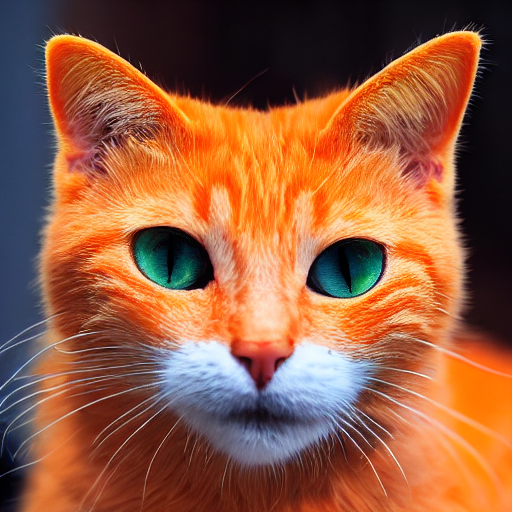

In [ ]:
seed = 777
prompt = "photograph of orange cat"
generator = torch.Generator("cuda").manual_seed(seed)
h, w = 512, 512
img = pipe(prompt, height=h, width=w, generator=generator).images[0]
img

> Portrait mode



  0%|          | 0/50 [00:00<?, ?it/s]

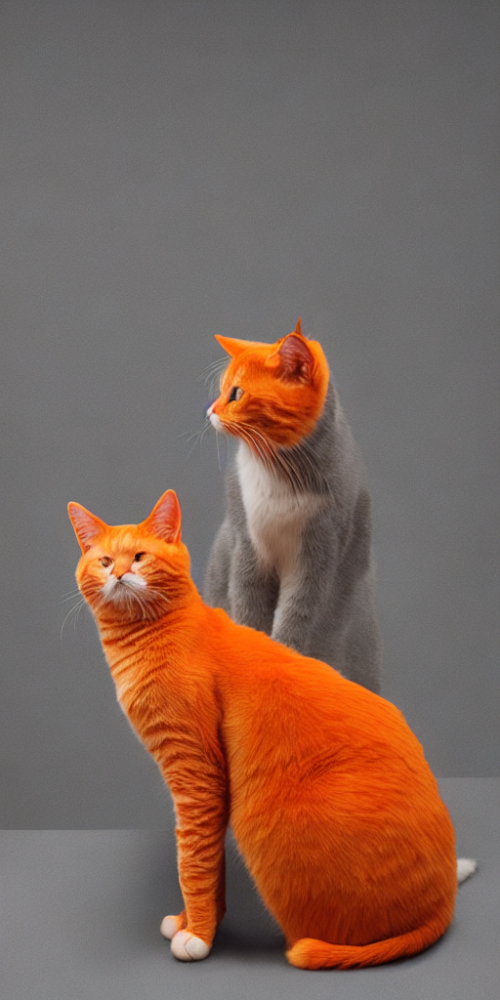

In [ ]:
generator = torch.Generator("cuda").manual_seed(seed)
h, w = 1024, 512 (128, 256, 512, 640, 768,)
img = pipe(prompt, height=h, width=w, generator=generator).images[0]
img

# seed > rng/randomizer awal

### Negative prompt

We can use negative prompt to tell Stable Diffusion things we don't want in our image.

In [ ]:
num_images = 5

prompt = 'photograph of cat'
neg_prompt = 'yellow, black, city'

imgs = pipe(prompt, negative_prompt = neg_prompt, num_images_per_prompt=num_images).images


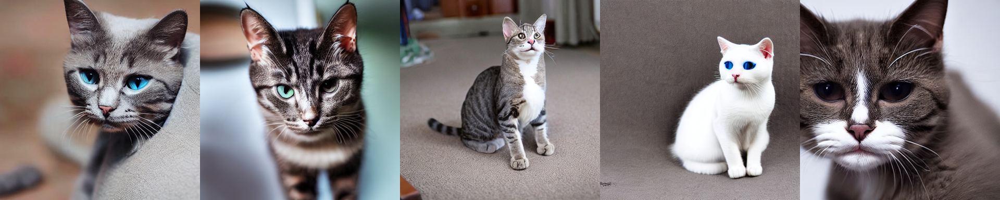

In [ ]:
grid = grid_img(imgs, rows = 1, cols = 5, scale=0.75)
grid

## Other models

### SD v1.5

In [ ]:
sd15 = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
sd15 = sd15.to('cuda')
sd15.enable_attention_slicing()
sd15.enable_xformers_memory_efficient_attention()

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

text_encoder/pytorch_model.fp16.safetensors not found


Fetching 29 files:   0%|          | 0/29 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.non_ema.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

(…)fusion_pytorch_model.non_ema.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

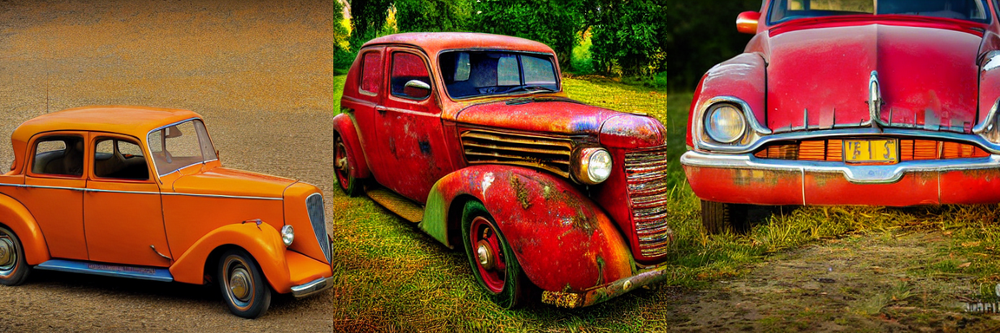

In [ ]:
num_imgs = 3

prompt = "photograph of an old car"
neg_prompt = 'black white'

imgs = sd15(prompt, negative_prompt=neg_prompt, num_images_per_prompt=num_imgs).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

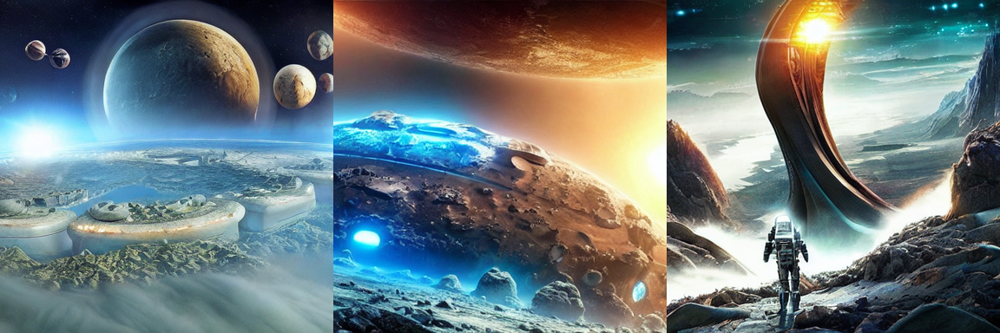

In [ ]:
prompt = "photo of a futuristic city on another planet, realistic, full hd"
neg_prompt = 'buildings'

imgs = sd15(prompt, negative_prompt = neg_prompt, num_images_per_prompt=num_imgs).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

In [ ]:
# RunwayML
# stabilityai

### SD v2.x

In [ ]:
sd2 = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16)
sd2 = sd2.to("cuda")
sd2.enable_attention_slicing()
sd2.enable_xformers_memory_efficient_attention()

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

text_encoder/pytorch_model.fp16.safetensors not found


Fetching 22 files:   0%|          | 0/22 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/681M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/681M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

KeyboardInterrupt: 

In [ ]:
prompt = "photograph of an old car"
neg_prompt = 'black white'


imgs = sd2(prompt, negative_prompt=neg_prompt, num_images_per_prompt=num_imgs).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

### Fine-tuned models with specific styles

> Mo-di-diffusion (Modern Disney style)

https://huggingface.co/nitrosocke/mo-di-diffusion



In [ ]:
modi = StableDiffusionPipeline.from_pretrained("nitrosocke/mo-di-diffusion", torch_dtype=torch.float16)
modi = modi.to("cuda")
modi.enable_attention_slicing()
modi.enable_xformers_memory_efficient_attention()

In [ ]:
prompt = "a photograph of an astronaut riding a horse, modern disney style"

seed = 777
generator = torch.Generator("cuda").manual_seed(seed)

imgs = modi(prompt, generator=generator, num_images_per_prompt=num_imgs).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

In [ ]:
prompt = "orange cat, modern disney style"

generator = torch.Generator("cuda").manual_seed(seed)
imgs = modi(prompt, generator=generator, num_images_per_prompt=3).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.5)
grid

In [ ]:
prompt = ["albert einstein, modern disney style",
          "modern disney style old chevette driving in the desert, golden hour",
          "modern disney style delorean"]

seed = 777
print("Seed: ".format(str(seed)))
generator = torch.Generator("cuda").manual_seed(seed)
imgs = modi(prompt, generator=generator).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

#### Other models

* Classic Disney Style - https://huggingface.co/nitrosocke/classic-anim-diffusion

* High resolution 3D animation - https://huggingface.co/nitrosocke/redshift-diffusion

* Futuristic images - https://huggingface.co/nitrosocke/Future-Diffusion

* Other animation styles:
 * https://huggingface.co/nitrosocke/Ghibli-Diffusion
 * https://huggingface.co/nitrosocke/spider-verse-diffusion
* more models https://huggingface.co/models?other=stable-diffusion-diffusers

## Changing the scheduler (sampler)

We can also change the scheduler for our Stable Diffusion.

- Available schedulers:
https://huggingface.co/docs/diffusers/using-diffusers/schedulers#schedulers-summary


Default is [PNDMScheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_pndm.py).


In [ ]:
sd15 = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
sd15 = sd15.to("cuda")
sd15.enable_attention_slicing()
sd15.enable_xformers_memory_efficient_attention()

In [ ]:
sd15.scheduler

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.11.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "trained_betas": null
}

  0%|          | 0/50 [00:00<?, ?it/s]

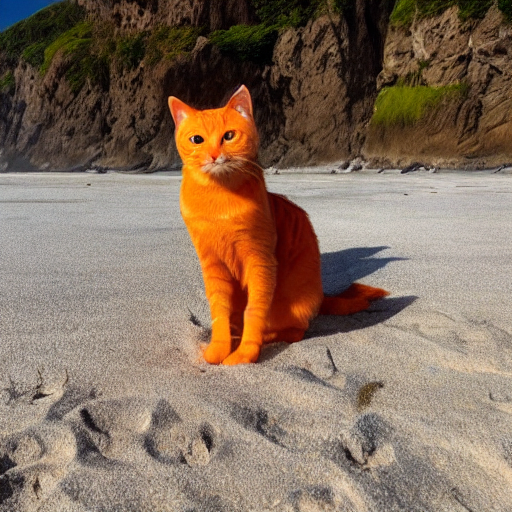

In [ ]:
seed = 777
prompt = "a photo of a orange cat wearing sunglasses, on the beach, ocean in the background"
generator = torch.Generator('cuda').manual_seed(seed)
img = sd15(prompt, generator=generator).images[0]
img

In [ ]:
sd15.scheduler.compatibles

[diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler]

In [ ]:
sd15.scheduler.config

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.00085),
            ('beta_end', 0.012),
            ('beta_schedule', 'scaled_linear'),
            ('trained_betas', None),
            ('skip_prk_steps', True),
            ('set_alpha_to_one', False),
            ('prediction_type', 'epsilon'),
            ('steps_offset', 1),
            ('_class_name', 'PNDMScheduler'),
            ('_diffusers_version', '0.11.1'),
            ('clip_sample', False)])

In [ ]:
from diffusers import DDIMScheduler
sd15.scheduler = DDIMScheduler.from_config(sd15.scheduler.config)

  0%|          | 0/50 [00:00<?, ?it/s]

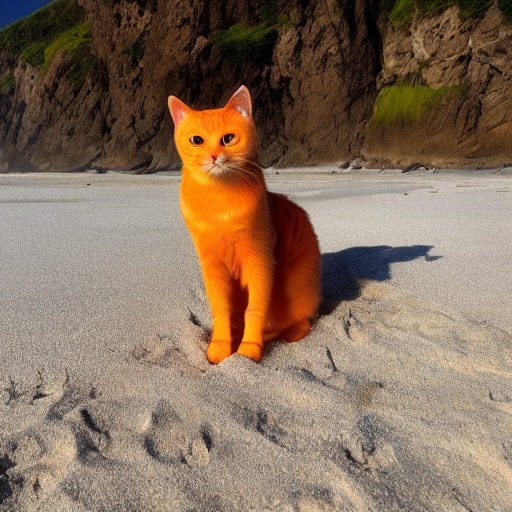

In [ ]:
generator = torch.Generator(device = 'cuda').manual_seed(seed)
img = sd15(prompt, generator=generator).images[0]
img

  0%|          | 0/60 [00:00<?, ?it/s]

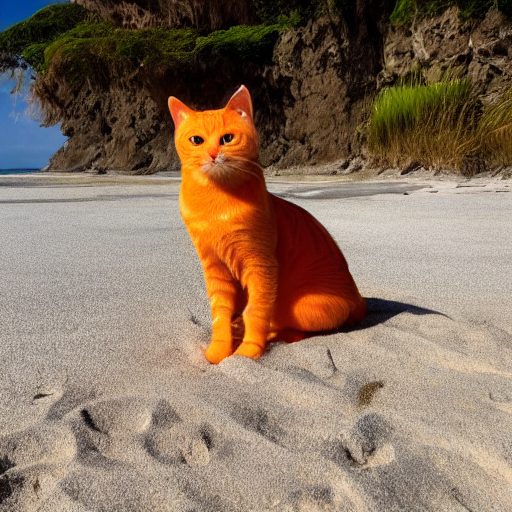

In [ ]:
from diffusers import LMSDiscreteScheduler
sd15.scheduler = LMSDiscreteScheduler.from_config(sd15.scheduler.config)
generator = torch.Generator(device = 'cuda').manual_seed(seed)
img = sd15(prompt, num_inference_steps = 60, generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

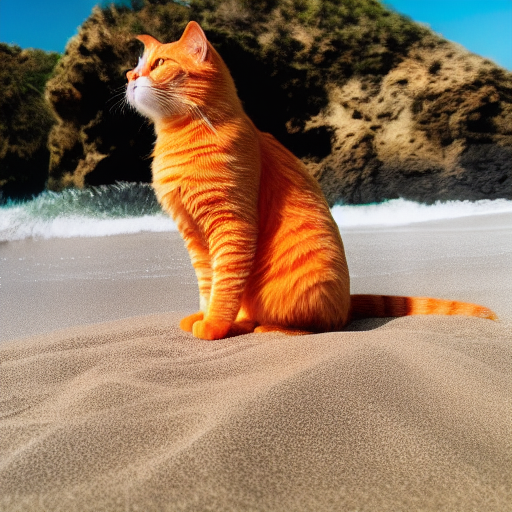

In [ ]:
from diffusers import EulerAncestralDiscreteScheduler

sd15.scheduler = EulerAncestralDiscreteScheduler.from_config(sd15.scheduler.config)

generator = torch.Generator(device="cuda").manual_seed(seed)
img = sd15(prompt, generator=generator, num_inference_steps=50).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

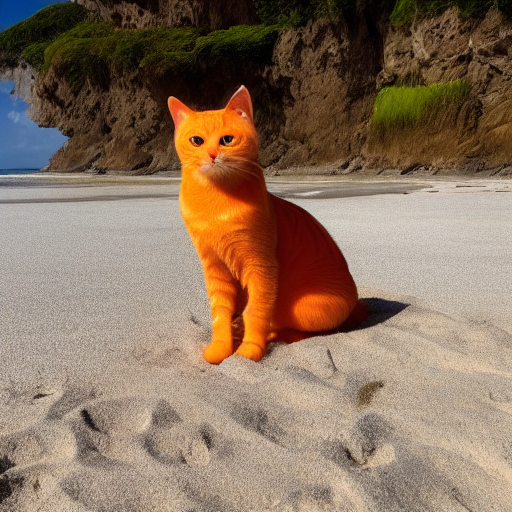

In [ ]:
from diffusers import EulerDiscreteScheduler

sd15.scheduler = EulerDiscreteScheduler.from_config(sd15.scheduler.config)

generator = torch.Generator(device="cuda").manual_seed(seed)
img = sd15(prompt, generator=generator, num_inference_steps=50).images[0]
img

In [ ]:
Stable diffusion > diffusion > stochastic distribution > scheduler

